In [ ]:
# import numpy as np
# import pandas as pd
# from scipy.sparse import csc_matrix
# import matplotlib.pyplot as plt
# import matplotlib.dates as mdates
# import h5py
# import joblib
# from sklearn import model_selection, feature_selection, kernel_approximation, ensemble, linear_model, metrics
    
# print("Import data file")

# X = pd.read_hdf('/home/s2316001/codepaper/data_window_botnet3.h5', key='data')
# X.reset_index(drop=True, inplace=True)

# X2 = pd.read_hdf('/home/s2316001/codepaper/data_window3_botnet3.h5', key='data')
# X2.reset_index(drop=True, inplace=True)

# X = Xtemp.join(Xtemp2)

# X.drop('window_id', axis=1, inplace=True)

# y = Xtemp['Label_<lambda>']
# X.drop('Label_<lambda>', axis=1, inplace=True)

# labels = np.load("/home/s2316001/codepaper/data_window_botnet3_labels.npy",allow_pickle = True)

# print(X.columns.values)
# print(labels)
# print(np.where(labels == 'flow=From-Botne')[0][0])

# y_bin6 = y==np.where(labels == 'flow=From-Botne')[0][0]
# X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y_bin6, test_size=0.33, random_state=123456)
# X_train = np.reshape(X_train, (X_train.shape[0], 1, X_train.shape[1]))
# X_test = np.reshape(X_test, (X_test.shape[0], 1, X_test.shape[1]))
# print("y", np.unique(y, return_counts=True))
# print("y_train", np.unique(y_train, return_counts=True))
# print("y_test", np.unique(y_test, return_counts=True))


In [6]:
import numpy as np
import pandas as pd
from scipy.sparse import csc_matrix
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import h5py
import joblib
from sklearn import model_selection, feature_selection, kernel_approximation, ensemble, linear_model, metrics
import random
# Create an empty dataframe to store the concatenated data
# Create empty lists to store the combined data and labels
combined_data = pd.DataFrame()
combined_y = pd.DataFrame()
combined_labels = []
random_numbers = random.sample(range(1, 14), 8)

for i in random_numbers:
    print(f"Importing data file{i}")

    Xtemp = pd.read_hdf(f'/home/s2316001/codepaper/data_window_botnet{i}.h5', key='data')
    Xtemp.reset_index(drop=True, inplace=True)

    Xtemp2 = pd.read_hdf(f'/home/s2316001/codepaper/data_window3_botnet{i}.h5', key='data')
    Xtemp2.reset_index(drop=True, inplace=True)

    Xtemp = Xtemp.join(Xtemp2)

    Xtemp.drop('window_id', axis=1, inplace=True)

    ytemp = Xtemp['Label_<lambda>']
    Xtemp.drop('Label_<lambda>', axis=1, inplace=True)

    # Concatenate the current data to the combined dataframe
    combined_data = pd.concat([combined_data.reset_index(drop=True), Xtemp.reset_index(drop=True)])
    combined_y = pd.concat([combined_y.reset_index(drop=True), ytemp.reset_index(drop=True)])
labels = np.load(f"/home/s2316001/codepaper/data_window_botnet3_labels.npy", allow_pickle=True)
    #combined_labels.append(labels)
print("Combined data shape:", combined_data.shape)
print("Combined y shape:", combined_y.shape)
#print("combined_labels:",combined_labels)
# Split the combined data into train and test sets
y_bin6 = combined_y == np.where(labels == 'flow=From-Botne')[0][0]
X_train, X_test, y_train, y_test = model_selection.train_test_split(combined_data, y_bin6, test_size=0.33, random_state=123456)
X_train = np.reshape(X_train, (X_train.shape[0], 1, X_train.shape[1]))
X_test = np.reshape(X_test, (X_test.shape[0], 1, X_test.shape[1]))

print("y", np.unique(combined_y, return_counts=True))
print("y_train", np.unique(y_train, return_counts=True))
print("y_test", np.unique(y_test, return_counts=True))


Matplotlib created a temporary config/cache directory at /tmp/matplotlib-eqzoxy75 because the default path (/home/jovyan/.cache/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


Importing data file8
Importing data file10
Importing data file2
Importing data file13
Importing data file5
Importing data file9
Importing data file3
Importing data file6
Combined data shape: (8405315, 22)
Combined y shape: (8405315, 1)
y (array([0., 1., 2., 3., 4., 5., 6.]), array([8155379,   23591,   52765,   24874,  115324,   32252,    1130]))
y_train (array([False,  True]), array([5630806,     755]))
y_test (array([False,  True]), array([2773379,     375]))


In [7]:
X_train, X_test, y_train, y_test

(array([[[-0.02638011, -0.02842328, -0.02397443, ...,  0.08583177,
           0.20229001,  0.18609941]],
 
        [[-0.04436646, -0.04782309, -0.04130005, ...,  0.12956846,
           0.27517622,  0.26063382]],
 
        [[-0.02638011, -0.02842328, -0.02397443, ...,  0.08583177,
           0.20229001,  0.18609941]],
 
        ...,
 
        [[-0.02921909, -0.06340767, -0.05346862, ...,  0.20665653,
           0.38334146,  0.38495507]],
 
        [[-0.02122044, -0.06340767, -0.05346862, ..., -5.53569439,
          -2.86726894, -2.84939631]],
 
        [[-0.02921909, -0.06340767, -0.05346862, ...,  0.20665653,
           0.38334146,  0.38495507]]]),
 array([[[-4.43664610e-02, -4.78230930e-02, -4.13000542e-02, ...,
           1.29568458e-01,  2.75176219e-01,  2.60633816e-01]],
 
        [[-2.63801064e-02, -2.84232815e-02, -2.39744291e-02, ...,
           8.58317692e-02,  2.02290010e-01,  1.86099410e-01]],
 
        [[-4.92306998e-02, -5.55752986e-02, -3.84971732e-02, ...,
           1.39

2023-06-29 07:11:19.333972: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
Matplotlib created a temporary config/cache directory at /tmp/matplotlib-98jw8gqg because the default path (/home/jovyan/.cache/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.
2023-06-29 07:11:28.139433: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in 

Epoch 1/10
27094/27094 [==============================] - 138s 5ms/step - loss: 0.0022 - accuracy: 0.9995 - val_loss: 7.8953e-04 - val_accuracy: 0.9998
Epoch 2/10
27094/27094 [==============================] - 138s 5ms/step - loss: 9.5570e-04 - accuracy: 0.9997 - val_loss: 6.8251e-04 - val_accuracy: 0.9998
Epoch 3/10
27094/27094 [==============================] - 142s 5ms/step - loss: 7.9859e-04 - accuracy: 0.9998 - val_loss: 5.4015e-04 - val_accuracy: 0.9999
Epoch 4/10
27094/27094 [==============================] - 143s 5ms/step - loss: 7.3393e-04 - accuracy: 0.9998 - val_loss: 4.9349e-04 - val_accuracy: 0.9999
Epoch 5/10
27094/27094 [==============================] - 141s 5ms/step - loss: 6.9812e-04 - accuracy: 0.9998 - val_loss: 4.8659e-04 - val_accuracy: 0.9999
Epoch 6/10
27094/27094 [==============================] - 143s 5ms/step - loss: 6.4355e-04 - accuracy: 0.9998 - val_loss: 4.8056e-04 - val_accuracy: 0.9999
Epoch 7/10
27094/27094 [==============================] - 142s 5ms/s

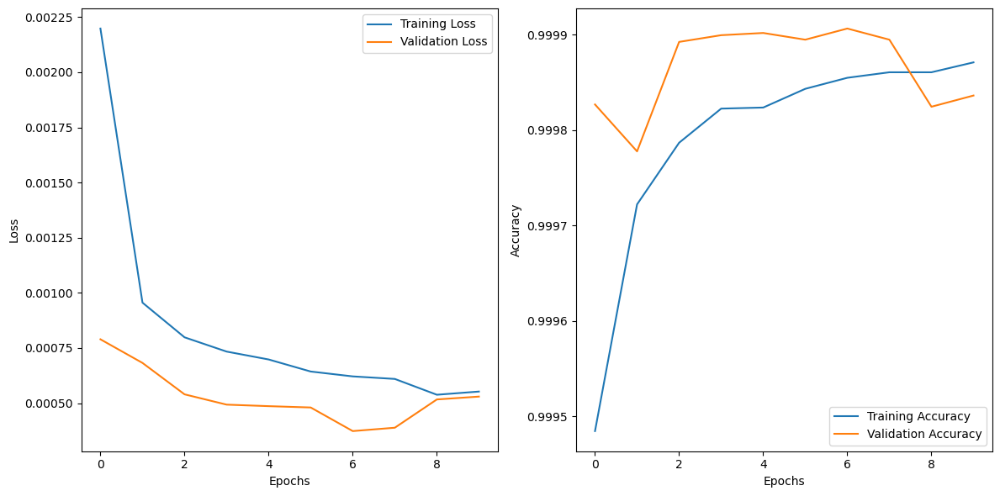

In [1]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn import model_selection, feature_selection, kernel_approximation, ensemble, linear_model, metrics, utils
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score,confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
for i in range (13,14):
    X = pd.read_hdf(f'/home/s2316001/codepaper/data_window_botnet{i}.h5', key='data')
    X.reset_index(drop=True, inplace=True)

    X2 = pd.read_hdf(f'/home/s2316001/codepaper/data_window3_botnet{i}.h5', key='data')
    X2.reset_index(drop=True, inplace=True)

    X = X.join(X2)

    X.drop('window_id', axis=1, inplace=True)

    y = X['Label_<lambda>']
    X.drop('Label_<lambda>', axis=1, inplace=True)
    labels = np.load(f"/home/s2316001/codepaper/data_window_botnet{i}_labels.npy", allow_pickle=True)

    #print("combined_labels:",combined_labels)
    # Split the combined data into train and test sets
    y_bin6 = y == np.where(labels == 'flow=From-Botne')[0][0]
    X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y_bin6, test_size=0.33, random_state=123456)
    X_train = np.reshape(X_train, (X_train.shape[0], 1, X_train.shape[1]))
    X_test = np.reshape(X_test, (X_test.shape[0], 1, X_test.shape[1]))

    # Build the LSTM model
    model = Sequential()
    model.add(LSTM(256, input_shape=(1, X_train.shape[2]), activation='relu', return_sequences=True))
    model.add(LSTM(128))
    model.add(Dense(1, activation='sigmoid'))
    # Compile the model
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    # Train the model
    history = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=10, batch_size=32)
    _, train_acc = model.evaluate(X_train, y_train, verbose=0)
    _, test_acc = model.evaluate(X_test, y_test, verbose=0)
    print('Accuracy Train: %.3f, Test: %.3f' % (train_acc, test_acc))
        # plot loss during training
    # plt.subplot(211)
    # plt.title('Loss')
    # plt.plot(history.history['loss'], label='train')
    # plt.plot(history.history['val_loss'], label='test')
    # plt.legend()
    # # plot accuracy during training
    # plt.subplot(212)
    # plt.title('Accuracy')
    # plt.plot(history.history['accuracy'], label='train')
    # plt.plot(history.history['val_accuracy'], label='test')
    # plt.legend()
    # plt.show()
    # Plot the loss and accuracy
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout()
    plt.savefig(f'/home/s2316001/codepaper/graph/loss_accuracy_plot{i}.png')  # Save the plot as an image file
    plt.show()
    # # predict probabilities for test set
    # yhat_probs = model.predict(X_test, verbose=0)
    # # predict crisp classes for test set
    # yhat_classes = (model.predict(X_test) > 0.5).astype("int32")
    # reduce to 1d array
    # yhat_probs = yhat_probs.reshape(yhat_probs.shape[0])
    # yhat_classes = yhat_classes.reshape(yhat_classes.shape[0])
    # print(f"---------------------- File {i} --------------------------")
    # # accuracy: (tp + tn) / (p + n)
    # accuracy = accuracy_score(y_test, yhat_classes)
    # print('Accuracy: %f' % accuracy)
    # # precision tp / (tp + fp)
    # precision = precision_score(y_test, yhat_classes)
    # print('Precision: %f' % precision)
    # # recall: tp / (tp + fn)
    # recall = recall_score(y_test, yhat_classes)
    # print('Recall: %f' % recall)
    # # f1: 2 tp / (2 tp + fp + fn)
    # f1 = f1_score(y_test, yhat_classes)
    # print('F1 score: %f' % f1)

    # confusion matrix
    # matrix = confusion_matrix(y_test, yhat_classes)
    # print(matrix)
    # Plot Confusion Matrix
    # plt.figure(figsize=(10, 8))
    # sns.heatmap(matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
    # plt.title('Confusion Matrix')
    # plt.xlabel('Predicted Labels')
    # plt.ylabel('True Labels')
    # plt.savefig(f'/home/s2316001/codepaper/graph/lstm_confusion_matrix{i}.png')
    # plt.show()
    # # Save the model
    # model.save(f'/home/s2316001/codepaper/LSTM/lstm_model{i}.h5')

0
22964/22964 [==============================] - 31s 1ms/step
1
22964/22964 [==============================] - 32s 1ms/step
2
22964/22964 [==============================] - 32s 1ms/step
3
22964/22964 [==============================] - 31s 1ms/step
4
22964/22964 [==============================] - 32s 1ms/step
5
22964/22964 [==============================] - 31s 1ms/step
6
22964/22964 [==============================] - 31s 1ms/step
7
22964/22964 [==============================] - 32s 1ms/step
8
22964/22964 [==============================] - 31s 1ms/step
9
22964/22964 [==============================] - 32s 1ms/step
10
22964/22964 [==============================] - 31s 1ms/step
11
22964/22964 [==============================] - 31s 1ms/step
12
22964/22964 [==============================] - 31s 1ms/step
13
22964/22964 [==============================] - 31s 1ms/step
14
22964/22964 [==============================] - 30s 1ms/step
15
22964/22964 [==============================] - 31s 1ms/step
16

/tmp/ipykernel_892654/2065514183.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 8))


21
22964/22964 [==============================] - 31s 1ms/step
22
22964/22964 [==============================] - 30s 1ms/step
23
22964/22964 [==============================] - 31s 1ms/step
24
22964/22964 [==============================] - 31s 1ms/step
25
22964/22964 [==============================] - 31s 1ms/step
26
22964/22964 [==============================] - 32s 1ms/step
27
22964/22964 [==============================] - 30s 1ms/step
28
22964/22964 [==============================] - 31s 1ms/step
29
22964/22964 [==============================] - 31s 1ms/step
30
22964/22964 [==============================] - 31s 1ms/step
31
22964/22964 [==============================] - 32s 1ms/step
32
22964/22964 [==============================] - 32s 1ms/step
33
22964/22964 [==============================] - 32s 1ms/step
34
22964/22964 [==============================] - 31s 1ms/step
35
22964/22964 [==============================] - 32s 1ms/step
36
22964/22964 [==============================] - 31s 1

/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


34
657/657 [==============================] - 1s 1ms/step
35
657/657 [==============================] - 1s 1ms/step
36
657/657 [==============================] - 1s 1ms/step
37
657/657 [==============================] - 1s 2ms/step
38
657/657 [==============================] - 1s 1ms/step
39
657/657 [==============================] - 1s 1ms/step
40
657/657 [==============================] - 1s 1ms/step
41
657/657 [==============================] - 1s 1ms/step
42
657/657 [==============================] - 1s 1ms/step


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


43
657/657 [==============================] - 1s 1ms/step
44
657/657 [==============================] - 1s 1ms/step
45
657/657 [==============================] - 1s 1ms/step
46
657/657 [==============================] - 1s 1ms/step
47
657/657 [==============================] - 1s 1ms/step
48
657/657 [==============================] - 1s 1ms/step
49
657/657 [==============================] - 1s 1ms/step
---------------------- File 5 --------------------------
Test
accuracy =  0.9997981240775127 8.222457037535267e-05 [0.9996191  0.99985716 0.99971433 0.99985716 0.99985716 0.99985716
 0.99990478 0.99976194 0.99976194 0.99985716 0.99966671 0.99985716
 0.99971433 0.99990478 0.99990478 0.99985716 0.99966671 0.99971433
 0.99980955 0.99990478 0.99971433 0.9996191  0.99980955 0.99990478
 0.99976194 0.99976194 0.99976194 0.99985716 0.99980955 0.99976194
 0.99980955 0.99976194 0.99985716 0.99985716 0.99980955 0.99976194
 0.99976194 0.99990478 0.99985716 0.99971433 0.99980955 0.99985716
 0.9998571

/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1609: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))


523/523 [==============================] - 1s 1ms/step
2


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
3


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
4


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
5


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
6


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
7


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 2ms/step
8


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
9


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
10


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
11


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
12


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
13


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1609: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))


523/523 [==============================] - 1s 1ms/step
14


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
15


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1609: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))


523/523 [==============================] - 1s 1ms/step
16


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
17


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
18


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1609: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))


523/523 [==============================] - 1s 1ms/step
19


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
20


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
21


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
22


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
23


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
24


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
25


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1609: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))


523/523 [==============================] - 1s 1ms/step
26


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
27


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
28


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
29


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
30


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
31


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
32


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
33


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 2ms/step
34


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
35


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
36


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
37


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
38


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
39


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
40


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
41


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
42


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
43


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
44


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
45


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
46


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
47


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
48


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 2ms/step
49


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


523/523 [==============================] - 1s 1ms/step
---------------------- File 7 --------------------------
Test
accuracy =  0.9998575532678956 7.654451653699357e-05 [1.         0.99994015 0.99976059 0.9998803  0.9998803  0.99976059
 0.99982045 0.99976059 0.99982045 0.9998803  0.99982045 0.99982045
 1.         0.99994015 1.         0.99976059 0.99982045 1.
 0.9998803  0.9998803  0.99994015 0.99976059 0.99994015 0.99982045
 1.         0.99982045 0.99976059 0.99976059 0.99994015 0.9998803
 0.99994015 0.9998803  0.9998803  0.99976059 0.9998803  0.99982045
 0.99982045 0.99994015 0.99982045 0.99976059 0.99982045 0.99982045
 0.99982045 0.99994015 0.99994015 0.99976059 0.99976059 0.99982045
 0.99982045 0.99982045]
precision =  0.0 0.0 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
recall =  0.0 0.0 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 

/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0
16950/16950 [==============================] - 26s 2ms/step
1
16950/16950 [==============================] - 24s 1ms/step
2
16950/16950 [==============================] - 22s 1ms/step
3
16950/16950 [==============================] - 24s 1ms/step
4
16950/16950 [==============================] - 23s 1ms/step
5
16950/16950 [==============================] - 24s 1ms/step
6
16950/16950 [==============================] - 23s 1ms/step
7
16950/16950 [==============================] - 24s 1ms/step
8
16950/16950 [==============================] - 23s 1ms/step
9
16950/16950 [==============================] - 23s 1ms/step
10
16950/16950 [==============================] - 24s 1ms/step
11
16950/16950 [==============================] - 24s 1ms/step
12
16950/16950 [==============================] - 23s 1ms/step
13
16950/16950 [==============================] - 23s 1ms/step
14
16950/16950 [==============================] - 24s 1ms/step
15
16950/16950 [==============================] - 23s 1ms/step
16

/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


635/635 [==============================] - 1s 1ms/step
3
635/635 [==============================] - 1s 1ms/step
4
635/635 [==============================] - 1s 1ms/step
5
635/635 [==============================] - 1s 2ms/step
6
635/635 [==============================] - 1s 2ms/step
7
635/635 [==============================] - 1s 2ms/step
8
635/635 [==============================] - 1s 2ms/step
9
635/635 [==============================] - 1s 2ms/step
10
635/635 [==============================] - 1s 1ms/step
11


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


635/635 [==============================] - 1s 2ms/step
12
635/635 [==============================] - 1s 1ms/step
13


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


635/635 [==============================] - 1s 1ms/step
14
635/635 [==============================] - 1s 2ms/step
15
635/635 [==============================] - 1s 2ms/step
16


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


635/635 [==============================] - 1s 2ms/step
17
635/635 [==============================] - 1s 1ms/step
18
635/635 [==============================] - 1s 2ms/step
19


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


635/635 [==============================] - 1s 2ms/step
20
635/635 [==============================] - 1s 2ms/step
21
635/635 [==============================] - 1s 2ms/step
22
635/635 [==============================] - 1s 1ms/step
23
635/635 [==============================] - 1s 2ms/step
24
635/635 [==============================] - 1s 2ms/step
25
635/635 [==============================] - 1s 2ms/step
26


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


635/635 [==============================] - 1s 2ms/step
27
635/635 [==============================] - 1s 2ms/step
28


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


635/635 [==============================] - 1s 2ms/step
29
635/635 [==============================] - 1s 1ms/step
30
635/635 [==============================] - 1s 1ms/step
31
635/635 [==============================] - 1s 2ms/step
32


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


635/635 [==============================] - 1s 2ms/step
33
635/635 [==============================] - 1s 2ms/step
34
635/635 [==============================] - 1s 2ms/step
35
635/635 [==============================] - 1s 2ms/step
36
635/635 [==============================] - 1s 1ms/step
37


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


635/635 [==============================] - 1s 1ms/step
38
635/635 [==============================] - 1s 1ms/step
39
635/635 [==============================] - 1s 2ms/step
40
635/635 [==============================] - 1s 2ms/step
41
635/635 [==============================] - 1s 2ms/step
42
635/635 [==============================] - 1s 2ms/step
43
635/635 [==============================] - 1s 1ms/step
44
635/635 [==============================] - 1s 1ms/step
45
635/635 [==============================] - 1s 1ms/step
46
635/635 [==============================] - 1s 1ms/step


/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


47
635/635 [==============================] - 1s 1ms/step
48
635/635 [==============================] - 1s 2ms/step
49
635/635 [==============================] - 1s 2ms/step
---------------------- File 11 --------------------------
Test
accuracy =  0.9997764868058292 6.977059369064416e-05 [0.9998523  0.99965538 0.9998523  0.99975384 0.99975384 0.9998523
 0.99970461 0.99975384 0.99980307 0.99970461 0.99980307 0.99970461
 0.9998523  0.99975384 0.99975384 0.99980307 0.9998523  0.99975384
 0.99975384 0.99990154 0.99975384 0.99975384 0.99975384 0.99975384
 0.99965538 0.9998523  0.99990154 0.99975384 0.99980307 0.99975384
 0.99970461 0.99980307 0.99975384 0.99975384 0.99955691 0.99980307
 0.99970461 0.99990154 0.9998523  0.9998523  0.99980307 0.99975384
 0.99980307 0.99980307 0.99970461 0.99980307 0.99965538 0.99975384
 0.9998523  0.9998523 ]
precision =  0.78 0.4142463035441596 [1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 1.
 1. 0. 1. 0. 1. 1. 1. 0. 1. 1. 1. 1. 0. 1

/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0
1617/1617 [==============================] - 2s 2ms/step
1
1617/1617 [==============================] - 2s 1ms/step
2
1617/1617 [==============================] - 3s 2ms/step
3
1617/1617 [==============================] - 3s 2ms/step
4
1617/1617 [==============================] - 2s 1ms/step
5
1617/1617 [==============================] - 2s 1ms/step
6
1617/1617 [==============================] - 2s 1ms/step
7
1617/1617 [==============================] - 2s 1ms/step
8
1617/1617 [==============================] - 2s 1ms/step
9
1617/1617 [==============================] - 2s 1ms/step
10
1617/1617 [==============================] - 2s 2ms/step
11
1617/1617 [==============================] - 3s 2ms/step
12
1617/1617 [==============================] - 2s 2ms/step
13
1617/1617 [==============================] - 3s 2ms/step
14
1617/1617 [==============================] - 2s 2ms/step
15
1617/1617 [==============================] - 2s 1ms/step
16
1617/1617 [==============================] - 2s

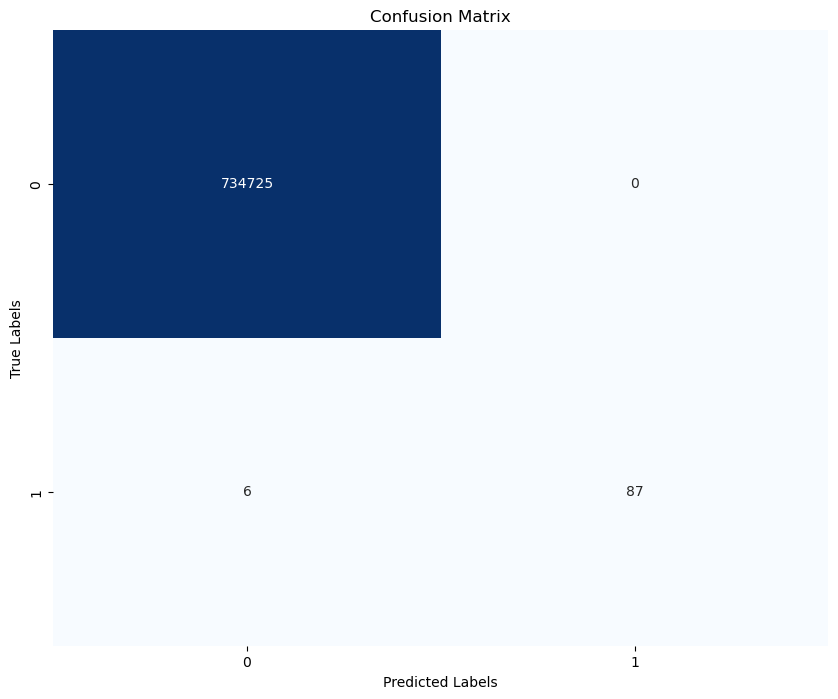

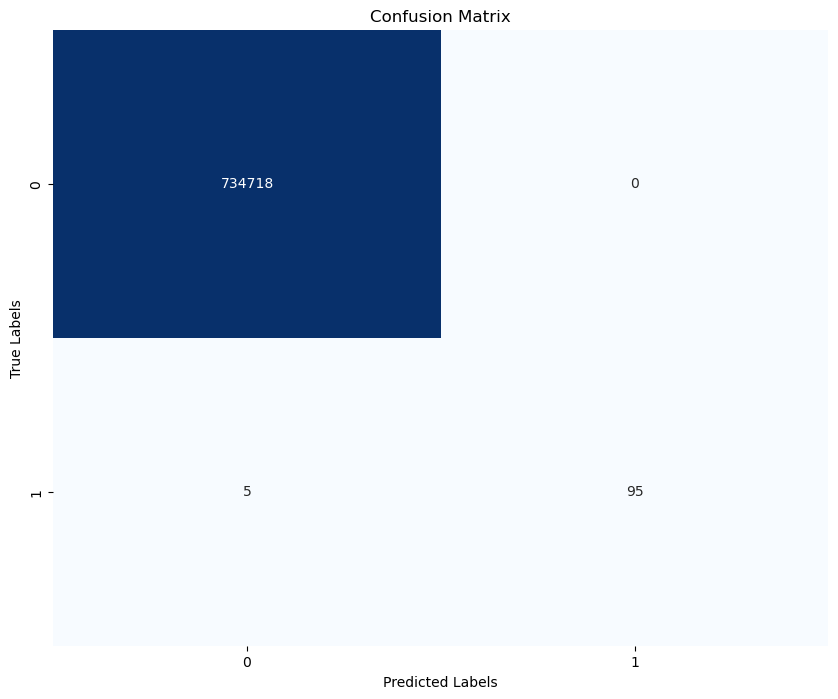

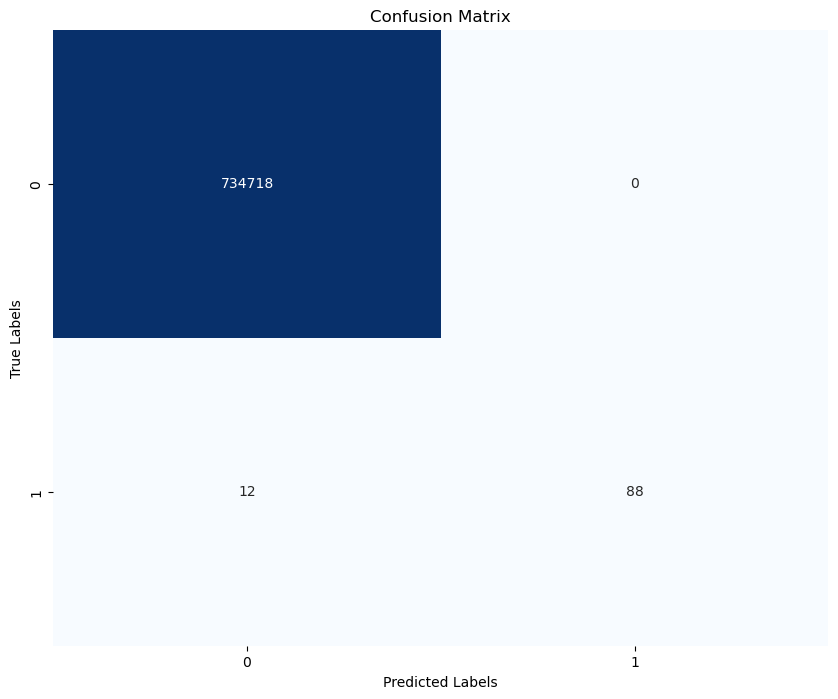

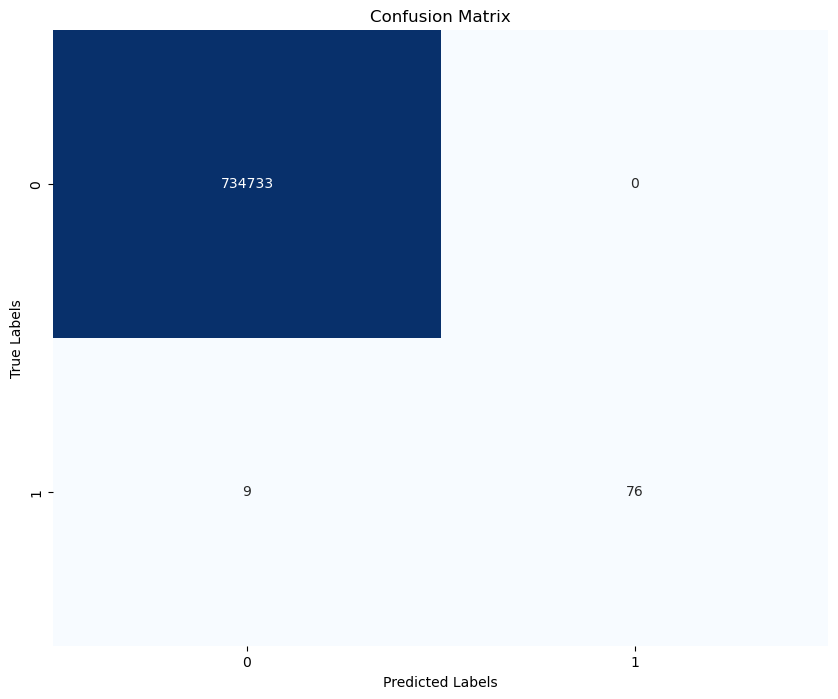

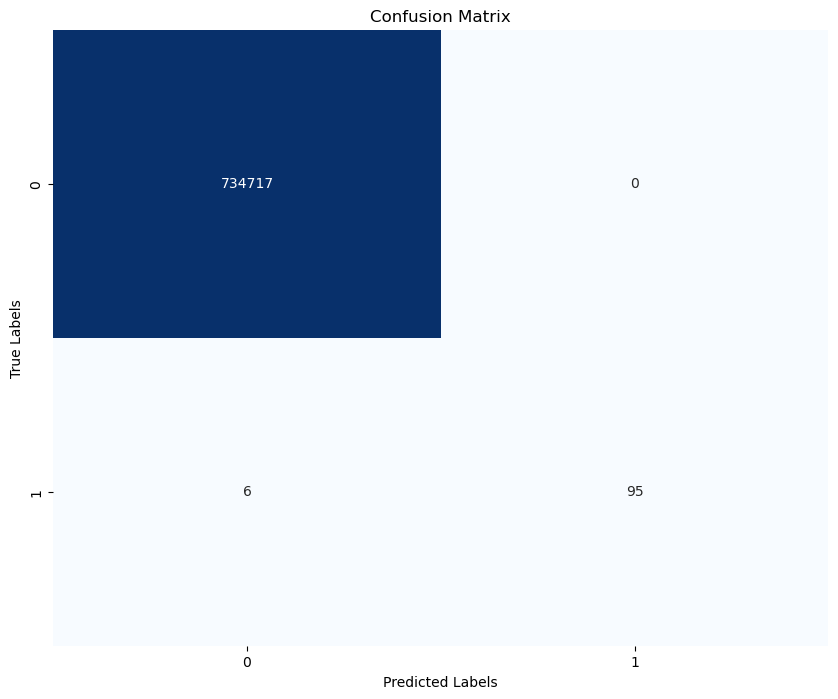

...

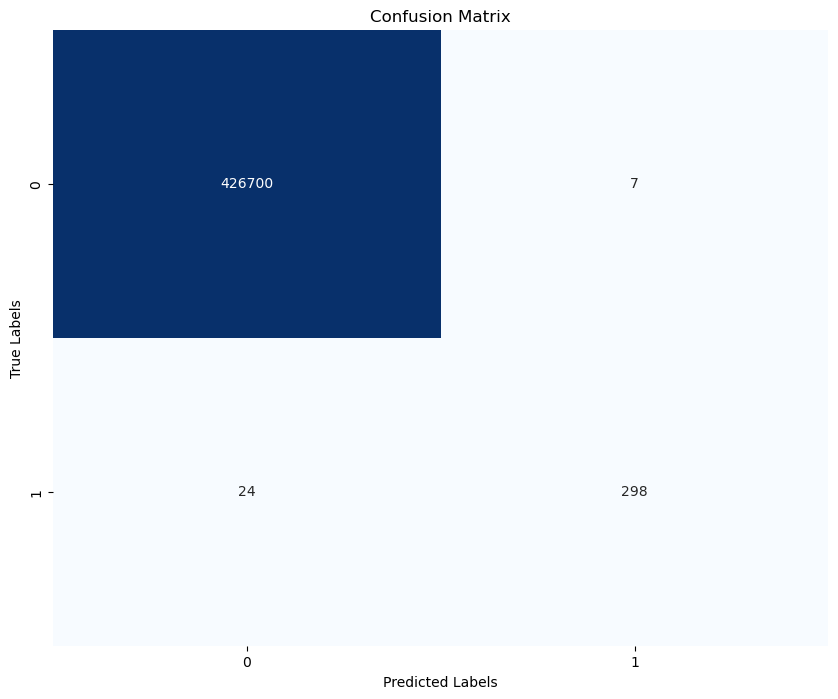

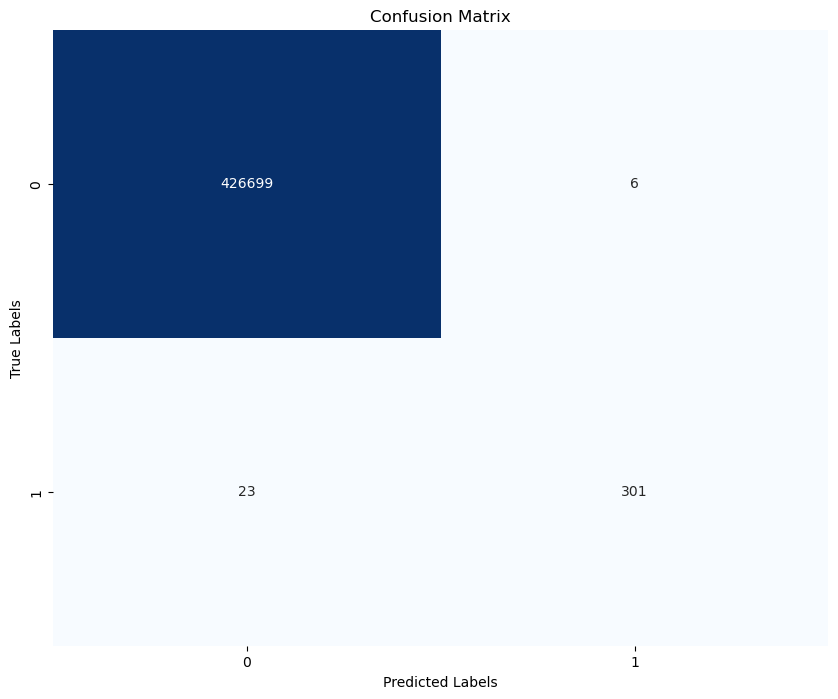

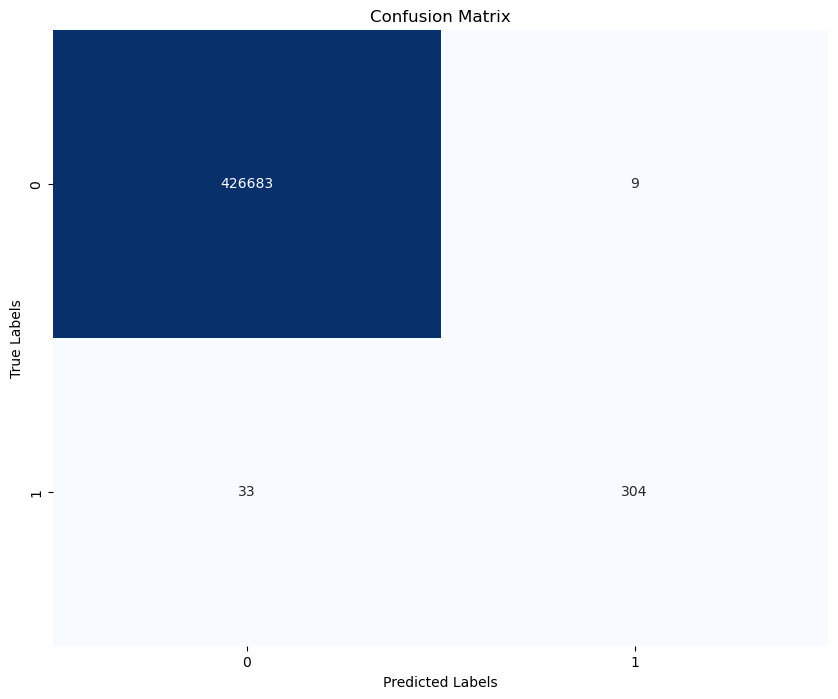

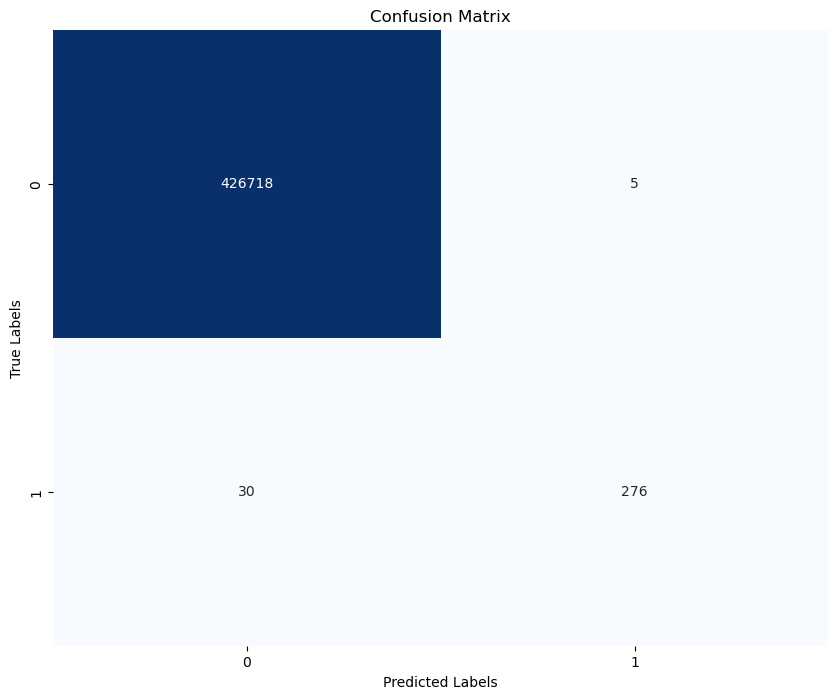

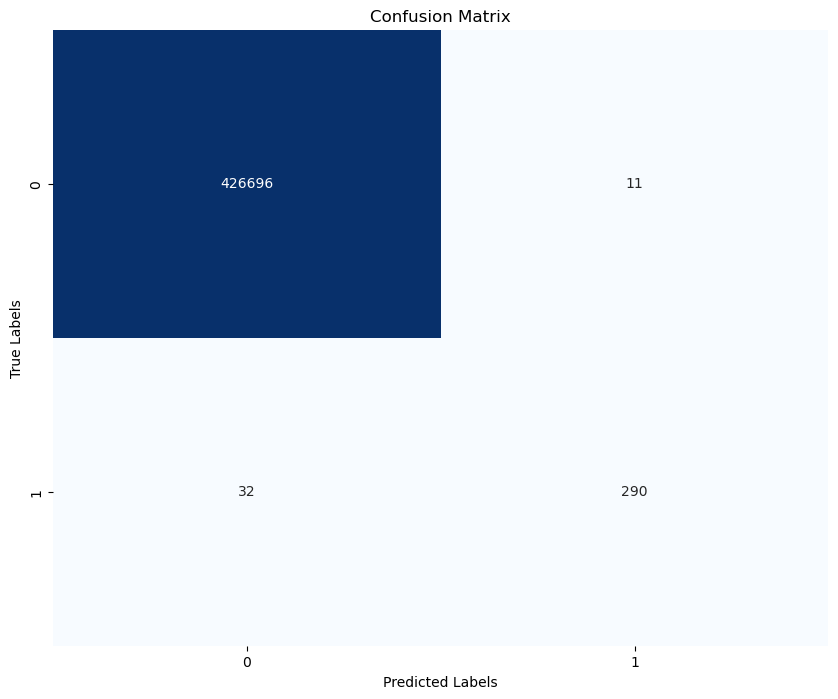

In [19]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score,confusion_matrix
import seaborn as sns
from scipy.sparse import csc_matrix
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import h5py
import joblib
from tensorflow.keras.models import load_model
from sklearn import model_selection, feature_selection, kernel_approximation, ensemble, linear_model, metrics, utils

nb_prediction = 50
np.random.seed(seed=123456)
tab_seed = np.random.randint(0, 1000000000, nb_prediction)
#print(tab_seed)
accuracy = np.array([0.]*nb_prediction)
precision = np.array([0.]*nb_prediction)
recall = np.array([0.]*nb_prediction)
f1 = np.array([0.]*nb_prediction)
for i in range (1,14):
    
    X = pd.read_hdf(f'/home/s2316001/codepaper/data_window_botnet{i}.h5', key='data')
    X.reset_index(drop=True, inplace=True)

    X2 = pd.read_hdf(f'/home/s2316001/codepaper/data_window3_botnet{i}.h5', key='data')
    X2.reset_index(drop=True, inplace=True)

    X = X.join(X2)

    X.drop('window_id', axis=1, inplace=True)

    y = X['Label_<lambda>']
    X.drop('Label_<lambda>', axis=1, inplace=True)
    labels = np.load(f"/home/s2316001/codepaper/data_window_botnet{i}_labels.npy", allow_pickle=True)

    #print("combined_labels:",combined_labels)
    # Split the combined data into train and test sets
    y_bin6 = y == np.where(labels == 'flow=From-Botne')[0][0]
    for j in range (0,nb_prediction):
        print(j)
        # predict probabilities for test set
        X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y_bin6, test_size=0.33, random_state=None)
        #X_test, y_test = utils.resample(X_test, y_test, n_samples=X_test.shape[0]*10, random_state=tab_seed[i])
        X_train = np.reshape(X_train, (X_train.shape[0], 1, X_train.shape[1]))
        X_test = np.reshape(X_test, (X_test.shape[0], 1, X_test.shape[1]))
        model_path = f'/home/s2316001/codepaper/LSTM/lstm_model{i}.h5'  # Change the path to the saved model
        loaded_model = load_model(model_path)
        #loaded_model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=10, batch_size=32)
        yhat_probs = loaded_model.predict(X_test, verbose=0)
        # predict crisp classes for test set
        yhat_classes = (loaded_model.predict(X_test) > 0.5).astype("int32")
        # reduce to 1d array
        # yhat_probs = yhat_probs.reshape(yhat_probs.shape[0])
        # yhat_classes = yhat_classes.reshape(yhat_classes.shape[0])
        #print(f"---------------------- File {i} --------------------------")
        # accuracy: (tp + tn) / (p + n)
        accuracy[j] = accuracy_score(y_test, yhat_classes)
        #print('Accuracy: %f' % accuracy)
        # precision tp / (tp + fp)
        precision[j] = precision_score(y_test, yhat_classes)
        #print('Precision: %f' % precision)
        # recall: tp / (tp + fn)
        recall[j] = recall_score(y_test, yhat_classes)
        #print('Recall: %f' % recall)
        # f1: 2 tp / (2 tp + fp + fn)
        f1[j] = f1_score(y_test, yhat_classes)
        #print('F1 score: %f' % f1)

        # confusion matrix
        matrix = confusion_matrix(y_test, yhat_classes)
        #print(matrix)
        # Plot Confusion Matrix
        plt.figure(figsize=(10, 8))
        sns.heatmap(matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
        plt.title('Confusion Matrix')
        plt.xlabel('Predicted Labels')
        plt.ylabel('True Labels')
        plt.savefig(f'/home/s2316001/codepaper/graph/test/lstm_confusion_matrix_file{i}_No{j}.png')
        # print(np.argwhere((y_true == 0) & yhat_classes).flatten())
        # print(np.argwhere(y_true & (yhat_classes == 0)).flatten())
        #plt.show()
    print(f"---------------------- File {i} --------------------------")
    print("Test")
    print("accuracy = ",accuracy.mean(),accuracy.std(),accuracy)
    print("precision = ", precision.mean(), precision.std(), precision)
    print("recall = ", recall.mean(), recall.std(), recall)
    print("f1 = ", f1.mean(), f1.std(), f1)

# Ensemble

In [12]:
import numpy as np
import pandas as pd
from scipy.sparse import csc_matrix
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import h5py
import pickle
from sklearn import model_selection, feature_selection, linear_model, metrics

print("Import data")

X = pd.read_hdf('/home/s2316001/codepaper/data_window_botnet1.h5', key='data')
X.reset_index(drop=True, inplace=True)

X2 = pd.read_hdf('/home/s2316001/codepaper/data_window3_botnet1.h5', key='data')
X2.reset_index(drop=True, inplace=True)

X = X.join(X2)

X.drop('window_id', axis=1, inplace=True)

y = X['Label_<lambda>']
X.drop('Label_<lambda>', axis=1, inplace=True)

labels = np.load("/home/s2316001/codepaper//data_window_botnet1_labels.npy",allow_pickle=True)

#print(X)
#print(y)
print(X.columns.values)
print(labels)

y_bin6 = y==np.where(labels == 'flow=From-Botne')[0][0]
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y_bin6, test_size=0.33)
#y_train_bin6 = y_train==6
#y_test_bin6 = y_test==6

print("y", np.unique(y, return_counts=True))
print("y_train", np.unique(y_train, return_counts=True))
print("y_test", np.unique(y_test, return_counts=True))
X_train = np.reshape(X_train, (X_train.shape[0], 1, X_train.shape[1]))
X_test = np.reshape(X_test, (X_test.shape[0], 1, X_test.shape[1]))
# load the model from disk
# loaded_model = pickle.load(open('/home/s2316001/codepaper/model/logistic_regression49.sav', 'rb'))
# loaded_model

Import data
['counts' 'Sport_nunique' 'DstAddr_nunique' 'Dport_nunique' 'Dur_sum'
 'Dur_mean' 'Dur_std' 'Dur_max' 'Dur_median' 'TotBytes_sum'
 'TotBytes_mean' 'TotBytes_std' 'TotBytes_max' 'TotBytes_median'
 'SrcBytes_sum' 'SrcBytes_mean' 'SrcBytes_std' 'SrcBytes_max'
 'SrcBytes_median' 'Sport_RU' 'DstAddr_RU' 'Dport_RU']
['flow=Background' 'flow=To-Backgro' 'flow=From-Backg' 'flow=From-Norma'
 'flow=To-Normal-' 'flow=Normal-V42' 'flow=From-Botne']
y (array([0, 1, 2, 3, 4, 6]), array([2207092,   18047,     263,     984,      48,     286]))
y_train (array([False,  True]), array([1491691,     211]))
y_test (array([False,  True]), array([734743,     75]))


In [21]:
# stacked generalization with linear meta model on blobs dataset
from sklearn.datasets import make_blobs
from sklearn.linear_model import LogisticRegression
from keras.models import load_model
from keras.utils import to_categorical
from numpy import dstack
import seaborn as sns
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score,confusion_matrix
import seaborn as sns
from scipy.sparse import csc_matrix
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import h5py
import joblib
from tensorflow.keras.models import load_model
from sklearn import model_selection, feature_selection, kernel_approximation, ensemble, linear_model, metrics, utils

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score,confusion_matrix
# load models from file
def load_all_models(n_models):
    all_models = list()
    for i in range(1,n_models):
     # define filename for this ensemble
        filename = f'/home/s2316001/codepaper/LSTM/lstm_model{i}.h5'
     # load model from file
        model = load_model(filename)
     # add to list of members
        all_models.append(model)
        #print('>loaded %s' % filename)
    return all_models
 
# create stacked model input dataset as outputs from the ensemble
def stacked_dataset(members, inputX):
    stackX = None
    for model in members:
     # make prediction
        yhat = model.predict(inputX, verbose=0)
     # stack predictions into [rows, members, probabilities]
        if stackX is None:
            stackX = yhat
        else:
            stackX = dstack((stackX, yhat))
     # flatten predictions to [rows, members x probabilities]
    stackX = stackX.reshape((stackX.shape[0], stackX.shape[1]*stackX.shape[2]))
    return stackX
 
# fit a model based on the outputs from the ensemble members
def fit_stacked_model(members, inputX, inputy):
    
     # create dataset using ensemble
    stackedX = stacked_dataset(members, inputX)
     # fit standalone model
    model = LogisticRegression()
    model.fit(stackedX, inputy)
    return model
 
# make a prediction with the stacked model
def stacked_prediction(members, model, inputX):
 # create dataset using ensemble
    stackedX = stacked_dataset(members, inputX)
 # make a prediction
    yhat = model.predict(stackedX)
    return yhat
# X_train = np.reshape(X_train, (X_train.shape[0], 1, X_train.shape[1]))
# X_test = np.reshape(X_test, (X_test.shape[0], 1, X_test.shape[1]))
# load all models
import numpy as np
import pandas as pd
from scipy.sparse import csc_matrix
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import h5py
import pickle
from sklearn import model_selection, feature_selection, linear_model, metrics
n_members = 14
print("Import data")
for j in range (1,14):
    X = pd.read_hdf(f'/home/s2316001/codepaper/data_window_botnet{j}.h5', key='data')
    X.reset_index(drop=True, inplace=True)

    X2 = pd.read_hdf(f'/home/s2316001/codepaper/data_window3_botnet{j}.h5', key='data')
    X2.reset_index(drop=True, inplace=True)

    X = X.join(X2)

    X.drop('window_id', axis=1, inplace=True)

    y = X['Label_<lambda>']
    X.drop('Label_<lambda>', axis=1, inplace=True)

    labels = np.load(f"/home/s2316001/codepaper/data_window_botnet{j}_labels.npy",allow_pickle=True)

    #print(X)
    #print(y)
    # print(X.columns.values)
    # print(labels)

    y_bin6 = y==np.where(labels == 'flow=From-Botne')[0][0]
    #X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y_bin6, test_size=0.33)
    #y_train_bin6 = y_train==6
    #y_test_bin6 = y_test==6

    #print("y", np.unique(y, return_counts=True))
    #X = np.reshape(X, (X.shape[0], 1, X.shape[1]))
    nb_prediction = 50
    accuracy_new = np.array([0.]*nb_prediction)
    precision_new = np.array([0.]*nb_prediction)
    recall_new = np.array([0.]*nb_prediction)
    fbeta_new = np.array([0.]*nb_prediction)
    for i in range(0,nb_prediction):
        X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y_bin6, test_size=0.33, random_state=None)
        members = load_all_models(n_members)
        X_test = np.reshape(X_test, (X_test.shape[0], 1, X_test.shape[1]))
    #print('Loaded %d models' % len(members))
    # evaluate standalone models on test dataset
    # for model in members:
    #     _, acc = model.evaluate(X_test, y_test, verbose=0)
    #     print('Model Accuracy: %.3f' % acc)
    # fit stacked model using the ensemble
    #model = fit_stacked_model(members, X_test, y_test)
    # evaluate model on test set
        yhat = stacked_prediction(members, model, X_test)
        accuracy_new[i] = accuracy_score(y_test , yhat)
        precision_new[i] = precision_score(y_test , yhat)
        recall_new[i] = recall_score(y_test , yhat)
        fbeta_new[i] = fbeta_score(y_test , yhat, beta=1)
        matrix = metrics.confusion_matrix(y_test, yhat)
        plt.figure(figsize=(10, 8))
        sns.heatmap(matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
        plt.title('Confusion Matrix')
        plt.xlabel('Predicted Labels')
        plt.ylabel('True Labels')
        plt.savefig(f'/home/s2316001/codepaper/model_LSTM_ensemble_test/LSTM_ensemble_confusion_matrix_file{j}_No{i}.png')
    print(f"-----------------Total {j}---------------")
    print("Test")
    print("Accuracy:",accuracy_new.mean(), accuracy_new.std(), accuracy_new)
    print("precision = ", precision_new.mean(), precision_new.std(), precision_new)
    print("recall = ", recall_new.mean(), recall_new.std(), recall_new)
    print("fbeta_score = ", fbeta_new.mean(), fbeta_new.std(), fbeta_new)

Import data
>loaded /home/s2316001/codepaper/LSTM/lstm_model1.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model2.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model3.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model4.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model5.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model6.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model7.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model8.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model9.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model10.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model11.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model12.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model13.h5
---------------file 1 --------------------
Stacked Test Accuracy: 1.000
Stacked Test precision: 1.000
Stacked Test recall: 0.878
Stacked Test f1: 0.935
>loaded /home/s2316001/codepaper/LSTM/lstm_model1.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model2.h5
>loaded /home/s2316001/codepaper/LSTM

/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


---------------file 7 --------------------
Stacked Test Accuracy: 1.000
Stacked Test precision: 0.000
Stacked Test recall: 0.000
Stacked Test f1: 0.000
>loaded /home/s2316001/codepaper/LSTM/lstm_model1.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model2.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model3.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model4.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model5.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model6.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model7.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model8.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model9.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model10.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model11.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model12.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model13.h5
---------------file 8 --------------------
Stacked Test Accuracy: 0.999
Stacked Test precision: 0.952
Stacked Test recall: 0.140
Stacked Test f1: 0.245
>lo

/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


---------------file 12 --------------------
Stacked Test Accuracy: 0.999
Stacked Test precision: 0.000
Stacked Test recall: 0.000
Stacked Test f1: 0.000
>loaded /home/s2316001/codepaper/LSTM/lstm_model1.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model2.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model3.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model4.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model5.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model6.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model7.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model8.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model9.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model10.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model11.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model12.h5
>loaded /home/s2316001/codepaper/LSTM/lstm_model13.h5
---------------file 13 --------------------
Stacked Test Accuracy: 0.999
Stacked Test precision: 0.571
Stacked Test recall: 0.004
Stacked Test f1: 0.008


In [14]:
# stacked generalization with linear meta model on blobs dataset
from sklearn.datasets import make_blobs
from sklearn.linear_model import LogisticRegression
from keras.models import load_model
from keras.utils import to_categorical
from numpy import dstack
import seaborn as sns
import numpy as np
import pandas as pd
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score,confusion_matrix
import seaborn as sns
from scipy.sparse import csc_matrix
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import h5py
import joblib
from tensorflow.keras.models import load_model
from sklearn import model_selection, feature_selection, kernel_approximation, ensemble, linear_model, metrics, utils

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score,confusion_matrix
# load models from file
def load_all_models(n_models):
    all_models = list()
    for i in range(1,n_models):
     # define filename for this ensemble
        filename = f'/home/s2316001/codepaper/LSTM/lstm_model{i}.h5'
     # load model from file
        model = load_model(filename)
     # add to list of members
        all_models.append(model)
        #print('>loaded %s' % filename)
    return all_models
 
# create stacked model input dataset as outputs from the ensemble
def stacked_dataset(members, inputX):
    stackX = None
    for model in members:
     # make prediction
        yhat = model.predict(inputX, verbose=0)
     # stack predictions into [rows, members, probabilities]
        if stackX is None:
            stackX = yhat
        else:
            stackX = dstack((stackX, yhat))
     # flatten predictions to [rows, members x probabilities]
    stackX = stackX.reshape((stackX.shape[0], stackX.shape[1]*stackX.shape[2]))
    return stackX
 
# fit a model based on the outputs from the ensemble members
def fit_stacked_model(members, inputX, inputy):
    
     # create dataset using ensemble
    stackedX = stacked_dataset(members, inputX)
     # fit standalone model
    model = LogisticRegression()
    model.fit(stackedX, inputy)
    return model
def cross_validation(model, _X, _y, _cv):
      '''Function to perform 5 Folds Cross-Validation
       Parameters
       ----------
      model: Python Class, default=None
              This is the machine learning algorithm to be used for training.
      _X: array
           This is the matrix of features.
      _y: array
           This is the target variable.
      _cv: int, default=5
          Determines the number of folds for cross-validation.
       Returns
       -------
       The function returns a dictionary containing the metrics 'accuracy', 'precision',
       'recall', 'f1' for both training set and validation set.
      '''
      _scoring = ['accuracy', 'precision', 'recall', 'f1']
      results = cross_validate(estimator=model,
                               X=_X,
                               y=_y,
                               cv=_cv,
                               scoring=_scoring,
                               return_train_score=True)
      
      return {"Training Accuracy scores": results['train_accuracy'],
              "Mean Training Accuracy": results['train_accuracy'].mean()*100,
              "Std Training Accuracy": results['train_accuracy'].std()*100,
              "Training Precision scores": results['train_precision'],
              "Mean Training Precision": results['train_precision'].mean(),
              "Std Training Precision": results['train_precision'].std(),
              "Training Recall scores": results['train_recall'],
              "Mean Training Recall": results['train_recall'].mean(),
              "Std Training Recall": results['train_recall'].std(),
              "Training F1 scores": results['train_f1'],
              "Mean Training F1 Score": results['train_f1'].mean(),
              "Std Training F1": results['train_f1'].std(),
              "Validation Accuracy scores": results['test_accuracy'],
              "Mean Validation Accuracy": results['test_accuracy'].mean()*100,
              "Std Validation Accuracy": results['test_accuracy'].std()*100,
              "Validation Precision scores": results['test_precision'],
              "Mean Validation Precision": results['test_precision'].mean(),
              "Std Validation Precision": results['test_precision'].std(),
              "Validation Recall scores": results['test_recall'],
              "Mean Validation Recall": results['test_recall'].mean(),
              "Std Validation Recall": results['test_recall'].std(),
              "Validation F1 scores": results['test_f1'],
              "Mean Validation F1 Score": results['test_f1'].mean(),
              "Std Validation F1": results['test_f1'].std(),
              }
# make a prediction with the stacked model
def stacked_prediction(members, model, inputX):
 # create dataset using ensemble
    stackedX = stacked_dataset(members, inputX)
 # make a prediction
    yhat = model.predict(stackedX)
    return yhat
# X_train = np.reshape(X_train, (X_train.shape[0], 1, X_train.shape[1]))
# X_test = np.reshape(X_test, (X_test.shape[0], 1, X_test.shape[1]))
# load all models
import numpy as np
import pandas as pd
from scipy.sparse import csc_matrix
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import h5py
import pickle
from sklearn import model_selection, feature_selection, linear_model, metrics
from sklearn.model_selection import cross_validate

n_members = 14
members = load_all_models(n_members)
#print("Import data")
for j in range (1,14):
    X = pd.read_hdf(f'/home/s2316001/codepaper/data_window_botnet{j}.h5', key='data')
    X.reset_index(drop=True, inplace=True)

    X2 = pd.read_hdf(f'/home/s2316001/codepaper/data_window3_botnet{j}.h5', key='data')
    X2.reset_index(drop=True, inplace=True)

    X = X.join(X2)

    X.drop('window_id', axis=1, inplace=True)

    y = X['Label_<lambda>']
    X.drop('Label_<lambda>', axis=1, inplace=True)

    labels = np.load(f"/home/s2316001/codepaper/data_window_botnet{j}_labels.npy",allow_pickle=True)

    #print(X)
    #print(y)
    # print(X.columns.values)
    # print(labels)

    y_bin6 = y==np.where(labels == 'flow=From-Botne')[0][0]
    #X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y_bin6, test_size=0.33)
    #y_train_bin6 = y_train==6
    #y_test_bin6 = y_test==6

    #print("y", np.unique(y, return_counts=True))
    #X = np.reshape(X, (X.shape[0], 1, X.shape[1]))
    # define 10-fold cross validation test harness
    nb_prediction = 10
    #kfold = StratifiedKFold(n_splits=nb_prediction, shuffle=True, random_state=43)
    accuracy_new = np.array([0.]*nb_prediction)
    precision_new = np.array([0.]*nb_prediction)
    recall_new = np.array([0.]*nb_prediction)
    fbeta_new = np.array([0.]*nb_prediction)
    #for i in range(0,nb_prediction):
    i = 0
    #for train, test in kfold.split(X, y_bin6):
        #X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y_bin6, test_size=0.33, random_state=None)
        #X_test = np.reshape(X_test, (X_test.shape[0], 1, X_test.shape[1]))
        #print('Loaded %d models' % len(members))
        # evaluate standalone models on test dataset
        # for model in members:
        #     _, acc = model.evaluate(X_test, y_test, verbose=0)
        #     print('Model Accuracy: %.3f' % acc)
    X = np.reshape(X, (X.shape[0], 1, X.shape[1]))
        # fit stacked model using the ensemble
    stackedX = stacked_dataset(members, X)
    model = LogisticRegression()
    #model = ensemble.RandomForestClassifier(n_estimators=1000, random_state=43)
    result = cross_validation(model,stackedX,y_bin6, nb_prediction)
    print(f'------------ Result {j}--------------')
    print(result)
    #model = fit_stacked_model(members, X[test], y_bin6[test])
    # evaluate model on test set
    # yhat = stacked_prediction(members, model, X_test)
    # accuracy_new[i] = accuracy_score(y_test , yhat)
    # precision_new[i] = precision_score(y_test , yhat)
    # recall_new[i] = recall_score(y_test , yhat)
    # fbeta_new[i] = f1_score(y_test , yhat)
    # matrix = metrics.confusion_matrix(y_test, yhat)
    # plt.figure(figsize=(10, 8))
    # sns.heatmap(matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
    # plt.title('Confusion Matrix')
    # plt.xlabel('Predicted Labels')
    # plt.ylabel('True Labels')
    # plt.savefig(f'/home/s2316001/codepaper/model_LSTM_ensemble_test/LSTM_ensemble_confusion_matrix_file{j}_No{i}.png')
    # plt.close()
#     filename = f'/home/s2316001/codepaper/LSTM_Ensemble/Ensemble_lstm_file{j}_model{i}.h5'
#     joblib.dump(model, filename)
#     print(f'---------------done {i}-------------')
#     i=i+1
#     print(f"-----------------Total {j}---------------")
#     print("Test")
#     print("Accuracy:",accuracy_new.mean(), accuracy_new.std(), accuracy_new)
#     print("precision = ", precision_new.mean(), precision_new.std(), precision_new)
#     print("recall = ", recall_new.mean(), recall_new.std(), recall_new)
#     print("fbeta_score = ", fbeta_new.mean(), fbeta_new.std(), fbeta_new)
joblib.dump(model, f'/home/s2316001/codepaper/LSTM_Ensemble/Last_Ensemble_lstm_model.h5')

------------ Result 0--------------
{'Training Accuracy scores': array([0.99999501, 0.99999102, 0.99999301, 0.99999301, 0.99999202,
       0.99999202, 0.99999301, 0.99999252, 0.99999102, 0.99999401]), 'Mean Training Accuracy': 99.99926648463511, 'Std Training Accuracy': 0.00011818798034982038, 'Training Precision scores': array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]), 'Mean Training Precision': 1.0, 'Std Training Precision': 0.0, 'Training Recall scores': array([0.96124031, 0.93023256, 0.94573643, 0.94573643, 0.93774319,
       0.93774319, 0.94552529, 0.94163424, 0.92996109, 0.95330739]), 'Mean Training Recall': 0.9428860133321268, 'Std Training Recall': 0.009221327015327838, 'Training F1 scores': array([0.98023715, 0.96385542, 0.97211155, 0.97211155, 0.96787149,
       0.96787149, 0.972     , 0.96993988, 0.96370968, 0.97609562]), 'Mean Training F1 Score': 0.970580383000297, 'Std Training F1': 0.004877432850409727, '\nValidation Accuracy scores': array([0.99995509, 0.99999102, 0.9999

/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: Un

------------ Result 0--------------
{'Training Accuracy scores': array([0.99983239, 0.99983239, 0.99983475, 0.99983239, 0.99983239,
       0.99983239, 0.99983239, 0.9998135 , 0.99980642, 0.99980878]), 'Mean Training Accuracy': 99.98257776848098, 'Std Training Accuracy': 0.0010756166634075825, 'Training Precision scores': array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]), 'Mean Training Precision': 1.0, 'Std Training Precision': 0.0, 'Training Recall scores': array([0.29      , 0.29      , 0.29292929, 0.29      , 0.29      ,
       0.29      , 0.29      , 0.21      , 0.18      , 0.19      ]), 'Mean Training Recall': 0.2612929292929293, 'Std Training Recall': 0.04501957537700465, 'Training F1 scores': array([0.4496124 , 0.4496124 , 0.453125  , 0.4496124 , 0.4496124 ,
       0.4496124 , 0.4496124 , 0.34710744, 0.30508475, 0.31932773]), 'Mean Training F1 Score': 0.41223193334763286, 'Std Training F1': 0.05865914294480616, '\nValidation Accuracy scores': array([0.99976629, 0.99976629, 0.99974

/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: Un

------------ Result 0--------------
{'Training Accuracy scores': array([0.99965083, 0.99966828, 0.99966828, 0.99965083, 0.99965083,
       0.99965083, 0.99965083, 0.99965083, 0.99965083, 0.99965083]), 'Mean Training Accuracy': 99.96543218062375, 'Std Training Accuracy': 0.000698135068442583, 'Training Precision scores': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]), 'Mean Training Precision': 0.0, 'Std Training Precision': 0.0, 'Training Recall scores': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]), 'Mean Training Recall': 0.0, 'Std Training Recall': 0.0, 'Training F1 scores': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]), 'Mean Training F1 Score': 0.0, 'Std Training F1': 0.0, '\nValidation Accuracy scores': array([0.99968578, 0.99952867, 0.99952867, 0.99968573, 0.99968573,
       0.99968573, 0.99968573, 0.99968573, 0.99968573, 0.99968573]), 'Mean Validation Accuracy': 99.96543252180003, 'Std Validation Accuracy': 0.006282639702917428, 'Validation Precision scores': array([0., 0.

/home/s2316001/.local/lib/python3.10/site-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 7 members, which is less than n_splits=10.
  warnings.warn(
/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1609: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use

------------ Result 0--------------
{'Training Accuracy scores': array([0.99984638, 0.99984638, 0.99986832, 0.99986832, 0.99986832,
       0.99986832, 0.99986832, 0.99986832, 0.99986832, 0.99984638]), 'Mean Training Accuracy': 99.98617393530701, 'Std Training Accuracy': 0.0010056491800422595, 'Training Precision scores': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]), 'Mean Training Precision': 0.0, 'Std Training Precision': 0.0, 'Training Recall scores': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]), 'Mean Training Recall': 0.0, 'Std Training Recall': 0.0, 'Training F1 scores': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]), 'Mean Training F1 Score': 0.0, 'Std Training F1': 0.0, '\nValidation Accuracy scores': array([1.        , 1.        , 0.99980249, 0.99980249, 0.99980249,
       0.99980249, 0.99980249, 0.99980249, 0.99980249, 1.        ]), 'Mean Validation Accuracy': 99.98617420501678, 'Std Validation Accuracy': 0.009051107436216479, 'Validation Precision scores': array([0., 0

/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: Un

------------ Result 0--------------
{'Training Accuracy scores': array([0.99972922, 0.99971117, 0.99971117, 0.99971117, 0.99972922,
       0.99972922, 0.99972922, 0.99972922, 0.99972922, 0.99972922]), 'Mean Training Accuracy': 99.97238062842398, 'Std Training Accuracy': 0.0008272074689033175, 'Training Precision scores': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]), 'Mean Training Precision': 0.0, 'Std Training Precision': 0.0, 'Training Recall scores': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]), 'Mean Training Recall': 0.0, 'Std Training Recall': 0.0, 'Training F1 scores': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]), 'Mean Training F1 Score': 0.0, 'Std Training F1': 0.0, '\nValidation Accuracy scores': array([0.99967511, 0.99983753, 0.99983753, 0.99983753, 0.99967506,
       0.99967506, 0.99967506, 0.99967506, 0.99967506, 0.99967506]), 'Mean Validation Accuracy': 99.97238070655774, 'Std Validation Accuracy': 0.00744494411969091, 'Validation Precision scores': array([0., 0.

/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/s2316001/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


------------ Result 0--------------
{'Training Accuracy scores': array([0.99916378, 0.99917087, 0.99916378, 0.99915669, 0.99916378,
       0.99913543, 0.9991    , 0.99912126, 0.99911417, 0.99914961]), 'Mean Training Accuracy': 99.91439363338083, 'Std Training Accuracy': 0.0023460885908608443, 'Training Precision scores': array([0.88235294, 0.90909091, 0.88235294, 0.87878788, 0.88235294,
       0.86666667, 0.84      , 0.85714286, 0.85185185, 0.9       ]), 'Mean Training Precision': 0.8750598987069574, 'Std Training Precision': 0.02028018298682908, 'Training Recall scores': array([0.20833333, 0.20833333, 0.20833333, 0.20138889, 0.20833333,
       0.18055556, 0.14583333, 0.16666667, 0.15972222, 0.1875    ]), 'Mean Training Recall': 0.1875, 'Std Training Recall': 0.02217877697593238, 'Training F1 scores': array([0.33707865, 0.33898305, 0.33707865, 0.32768362, 0.33707865,
       0.29885057, 0.24852071, 0.27906977, 0.26900585, 0.31034483]), 'Mean Training F1 Score': 0.30836943494759456, 'Std

['/home/s2316001/codepaper/LSTM_Ensemble/Last_Ensemble_lstm_model.h5']

In [2]:
from sklearn.model_selection import StratifiedKFold
kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=43)

In [4]:
kfold.split(X, y_bin6)

NameError: name 'X' is not defined

In [ ]:
joblib.dump(model, f'/home/s2316001/codepaper/LSTM_Ensemble/Last_Ensemble_lstm_model.h5')